In [1]:
## Decision Tree Regression

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('Data/Real-Data/Real_Combine.csv')
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [3]:
df = df.dropna()

In [7]:
x=df.iloc[:,:-1] ##independent features
y=df.iloc[:,-1] ##dependent features

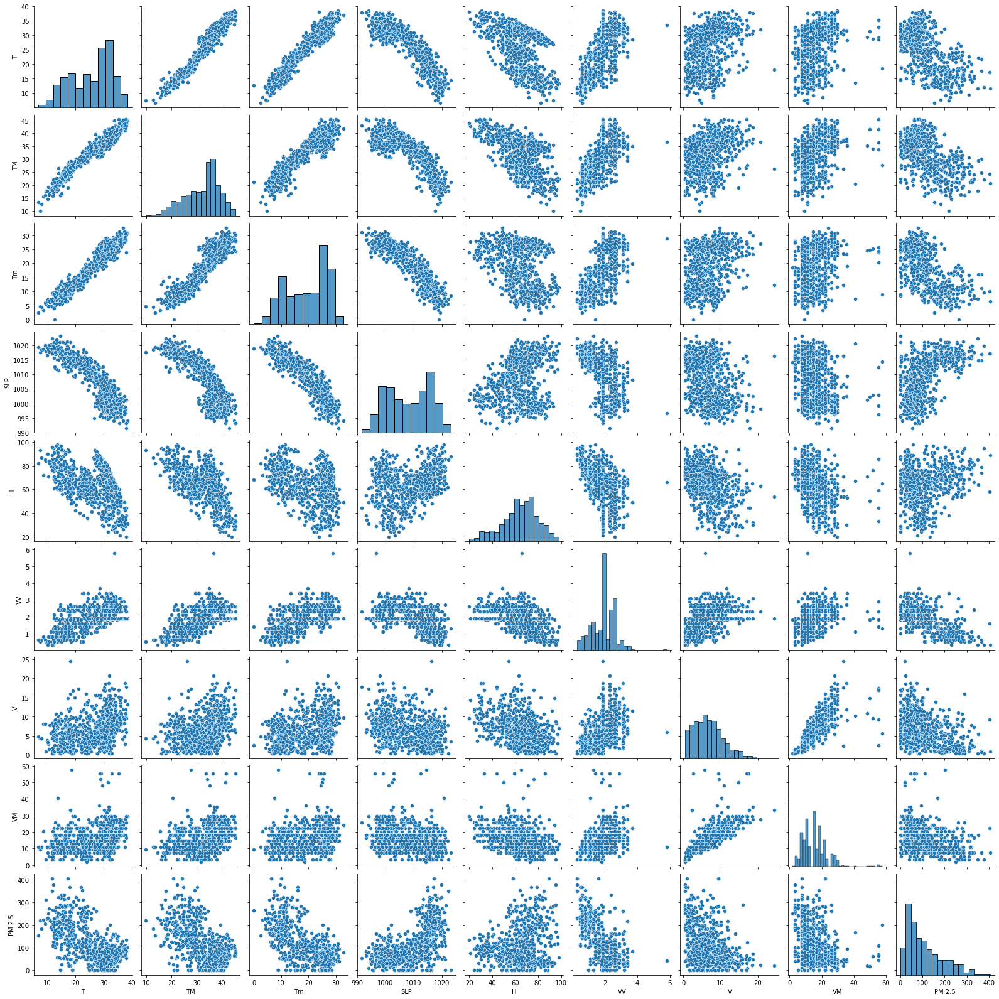

In [8]:
sns.pairplot(df)

In [9]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


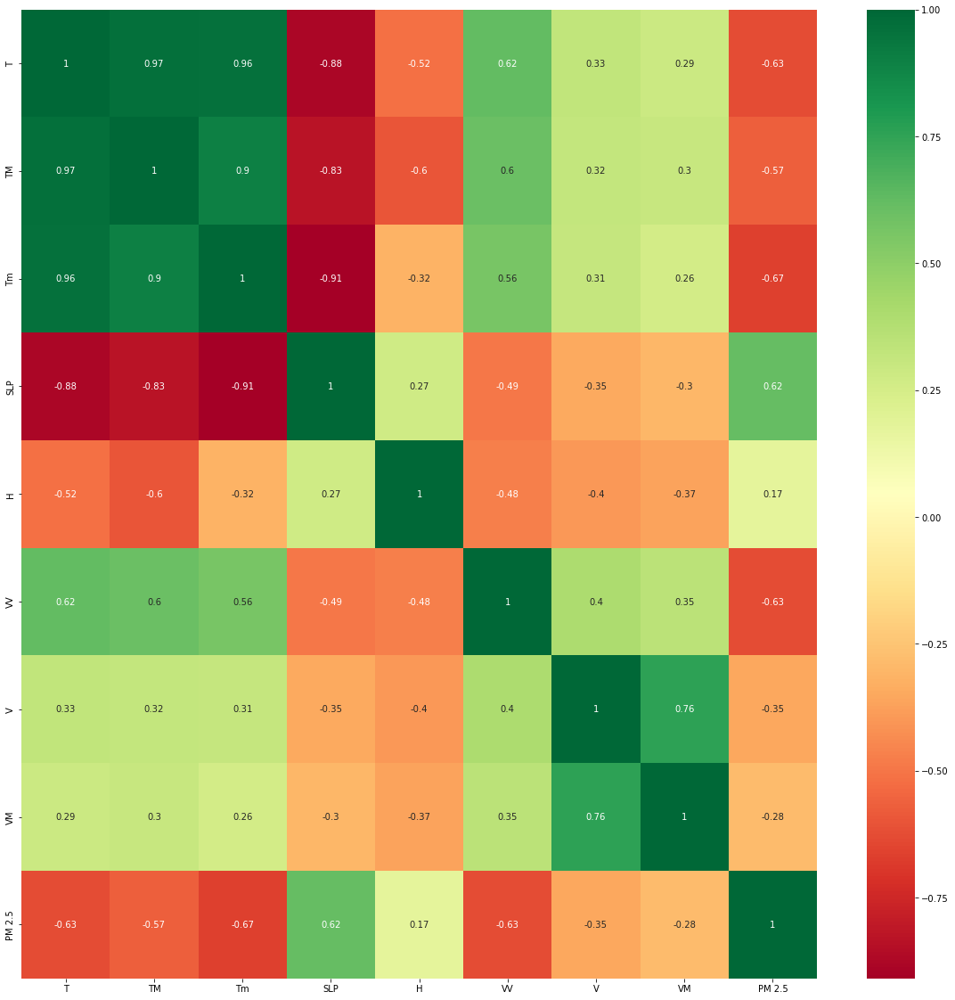

In [10]:
##get correlations for each features in dataset
corrmat=df.corr()
top_corr_features=corrmat.index
plt.figure(figsize=(20,20))

##plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [11]:
from sklearn.ensemble import ExtraTreesRegressor
model=ExtraTreesRegressor()
model.fit(x,y)

ExtraTreesRegressor()

In [12]:
x.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


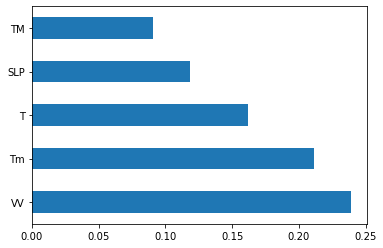

In [13]:
##plot graph for feature importances forr a better visualization

feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

C:\Users\Kanush\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

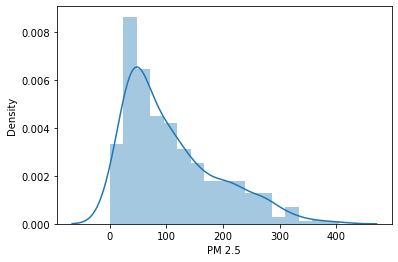

In [14]:
sns.distplot(y)

In [15]:
##Train test split

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

In [16]:
from sklearn.tree import DecisionTreeRegressor

In [17]:
dtree=DecisionTreeRegressor(criterion="mse")

In [18]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [19]:
print("Coefficient of determination R^2 <-- on train set: {}",format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: {} 1.0


In [20]:
print("Coefficient of determination R^2 <-- on train set: {}",format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on train set: {} 0.31749023769094065


In [21]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,x,y,cv=5)

In [22]:
score.mean()

0.13831359139689312

In [23]:
## Tree visualization

from IPython.display import Image
import six
import sys
sys.modules['sklearn.externals.six'] = six
from io import StringIO 
from sklearn.tree import export_graphviz
import pydotplus

In [24]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [25]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [29]:
dot_data = StringIO()
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [30]:
prediction=dtree.predict(X_test)

C:\Users\Kanush\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

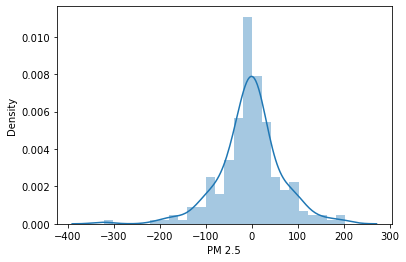

In [31]:
sns.distplot(y_test-prediction)

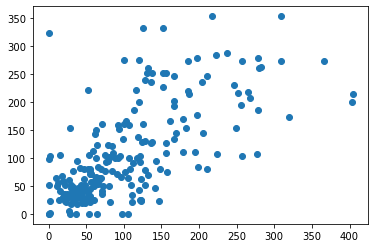

In [32]:
plt.scatter(y_test,prediction)

In [33]:
### HyperParameter Tuning Decision Tree Regressor

In [34]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [35]:
## Hyper Parameter Optimization

params={
    "splitter": ['best','random'],
    "max_depth": [3,4,5,6,8,10,12,15],
    "min_samples_leaf": [1,2,3,4,5],
    "min_weight_fraction_leaf": [0.1,0.2,0.3,0.4],
    "max_features": ["auto","log2","sqrt",None],
    "max_leaf_nodes": [None,10,20,30,40,50,60,70]
}

In [36]:
## HyperParameter Tuning using GridSearchCV

from sklearn.model_selection import GridSearchCV

In [37]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [38]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %i seconds.' % (thour, tmin, round(tsec, 2)))

In [40]:
from datetime import datetime
# Here we go
start_time=timer(None) # timer starts for start_time
random_search.fit(x,y)
timer(start_time) # timer ends (start_time)

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits

 Time taken: 0 hours 0 minutes and 34 seconds.


In [41]:
random_search.best_params_

{'max_depth': 5,
 'max_features': 'log2',
 'max_leaf_nodes': None,
 'min_samples_leaf': 5,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [42]:
random_search.best_score_

-3131.577079172524

In [45]:
predictions = random_search.predict(X_test)

C:\Users\Kanush\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

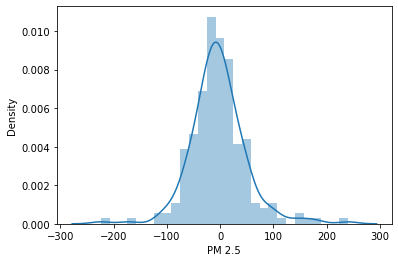

In [46]:
sns.distplot(y_test-predictions)

In [48]:
from sklearn import metrics
print('MAE:',metrics.mean_absolute_error(y_test, predictions))
print('MSE:',metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 37.0160472941003
MSE: 2756.884175873013
RMSE: 52.50603942284176


In [49]:
import pickle

In [50]:
# opened a file where I want to store data
file=open('decision_tree_regression_model.pkl', 'wb')

# dump info to the file
pickle.dump(random_search, file)